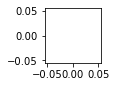

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
# force plt on windows 10
import matplotlib.pyplot as plt
plt.figure(figsize=(1,1))
plt.plot()

import sys
sys.path.append("..")

import torch
import torch.nn as nn
import numpy as np
import aggets.ds.window as window
import aggets.ds.hyper_f_load as hfl
import aggets.ds.window as window

## DISABLE THIS
import warnings
warnings.filterwarnings("ignore")

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def hists(x, y, ax_histx, ax_histy, color):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # now determine nice limits by hand:
    binwidth = 0.25
    xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
    lim = (int(xymax/binwidth) + 1) * binwidth

    bins = np.arange(-lim, lim + binwidth, binwidth)
    hx = ax_histx.bar(x, bins=bins, fc=color, density=True)
    hy = ax_histy.bar(y, bins=bins, orientation='horizontal', fc=color, density=True)
    
    return hx, hy

In [482]:
# Fixing random state for reproducibility
np.random.seed(19680801)

# some random data
x = np.random.randn(1000)
y = np.random.randn(1000)
x2 = np.random.randn(1000)
y2 = np.random.randn(1000)


# definitions for the axes
def make_skat():
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    spacing = 0.005

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom + height + spacing, width, 0.1]
    rect_histy = [left + width + spacing, bottom, 0.1, height]

    # start with a square Figure
    fig = plt.figure(figsize=(8, 8))

    ax = fig.add_axes(rect_scatter)
    ax_histx = fig.add_axes(rect_histx, sharex=ax)
    ax_histy = fig.add_axes(rect_histy, sharey=ax)
    return ax, ax_histx, ax_histy
# use the previously defined function
scatter_hist(x, y, ax, ax_histx, ax_histy)

plt.show()

In [620]:
import matplotlib.animation as animation

def get_cent_xy(state, n, hold=0.3): 
    current, prev = state
    if current == 0 and np.isclose(np.cos(n),0) and np.isclose(np.sin(n),1):
        if (np.random.rand() > hold):
            state = (1, current)
    if current == 1 and np.isclose(np.cos(n),0) and np.isclose(np.sin(n),1):
        if (np.random.rand() > hold):
            state = (0, current)
            
    if state[0] == 0:
        a, b = -1, 0
        c, d = 1, 1
    if state[0] == 1:
        a, b = 1, 0
        c, d = -1, -1
    return state, c * np.sin(n) + a, np.cos(n) + b


state = (0, 0)
x0 = []
y0 = []

frames = 1000

dv = 10
for step in range(frames):
    state, xx, yy = get_cent_xy(state, step/dv*np.pi)
    x0.append(xx)
    y0.append(yy)

state = (1, 1)
x1 = []
y1 = []

for step in range(frames):
    state, xx, yy = get_cent_xy(state, step/dv*np.pi + np.pi)
    x1.append(xx)
    y1.append(yy)


y_min, y_max = -5, 5
x_min, x_max = -5, 5

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

samples = 1000
points = np.zeros((frames, samples, 3))
positions = np.random.rand(samples, 3)
colors = np.zeros((frames, samples, 4))
red = np.array([1, 0, 0, 1])
blue = np.array([0, 0, 1, 1])

for frame in range(frames):
    points[frame] = positions
    points[frame, :, :2] = points[frame, :, :2] * 10 - 5
    arr = np.array([[x0[frame], y0[frame]], [x1[frame], y1[frame]]])
    d0 = np.sum((points[frame, :, :2] - arr[0, :]) ** 2, axis=1)
    d1 = np.sum((points[frame, :, :2] - arr[1, :]) ** 2, axis=1)
    d = (d0 - d1)
#     d = (d - d.min())/(d.max() - d.min()) * 2 - 1
    d = sigmoid(d / 5)
    points[frame, :, -1] = d > np.random.rand(samples)
    colors[frame, :, -1] = 0.3
    colors[frame, :, :-1] = blue[:-1]
    colors[frame, points[frame, :, -1] == 1.0, :-1] = red[:-1]

buckets = 20
# histx = np.zeros((frames, buckets, 1))
# histy = np.zeros((frames, buckets, 1))

# for frame in range(frames):
#     frame_points = points[frame, :, :]
#     frame_points[:, 0:2] = ((frame_points[:, 0:2].max(axis=0) - frame_points[:, 0:2]) 
#                             / (frame_points[:, 0:2].max(axis=0) - frame_points[:, 0:2].min(axis=0)))
#     frame_points[:, 0:2] = (frame_points[:, 0:2] * buckets).astype(int)
#     for b in range(buckets):
#         idx_b = frame_points[:, 0:2] == b
#         cntsx = frame_points[idx_b[:, 0], :].sum(axis=0)
#         histx[b] = np.nan_to_num(cntsx[2] / cntsx[0], 0, posinf=True, neginf=True)
#         cntsy = frame_points[idx_b[:, 1], :].sum(axis=0)
#         histy[b] = np.nan_to_num(cntsy[2] / cntsy[0], 0, posinf=True, neginf=True)
process = True

blues = points[0, :, 2] == 1
reds  = points[0, :, 2] == 0
positives = points[0, :, 2] == 1

def animate(i):
    scat1.set_edgecolors(colors[i])
    scat1.set_facecolors(colors[i])
#     if histo:
#         for n, (rbx, rby, bbx, bby) in enumerate(zip(red_barx, red_bary, blue_barx, blue_bary)):
#             blues = points[i, :, 2] == 1
#             reds  = points[i, :, 2] == 0
#             cntx = np.histogram(points[i, blues, 0], 40)[0]
#             cnty = np.histogram(points[i, blues, 1], 40)[0]
#             pos = np.histogram(points[i, blues & positives, 0], 40)[0]
#             bbx.set_height(np.nan_to_num(pos/cntx, posinf=True, neginf=True))
#             bby.set_height(np.nan_to_num(pos/cnty, posinf=True, neginf=True))
        
    if process:
        arr = np.array([[x0[i], y0[i]], [x1[i], y1[i]]])
        scat0.set_offsets(arr)
        scat0.set_edgecolors(np.array([blue, red]))
        scat0.set_facecolors(np.array([blue, red]))
    
    return scat,

TypeError: the dtypes of parameters y (object) and height (int64) are incompatible

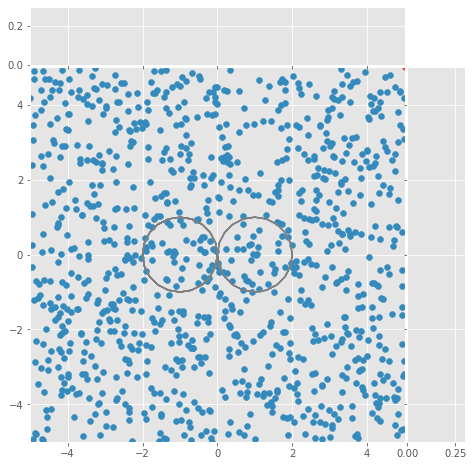

In [616]:
# _, ax = plt.subplots()
ax, hx, hy = make_skat()
# plt.figure(figsize=(5,5))
# ax = plt.gca()
ax.set_ylim(y_min, y_max)
ax.set_xlim(x_min, x_max)

ax.plot(x0, y0, color='gray')
scat0 = ax.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1 = ax.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1.set_offsets(points[i, :, :2])

hx.set_ylim(0, 0.3)
hy.set_xlim(0, 0.3)

blue_barx, blue_bary = hists(points[0, blues, 0], points[0, blues, 1], hx, hy, color=(0, 0, 1, 0.5))
red_barx, red_bary = hists(points[0, reds,  0], points[0, reds,  1], hx, hy, color=(1, 0, 0, 0.5))

barpath = path.Path(verts, codes)



from IPython.display import HTML
process = True
histo = True
anim = animation.FuncAnimation(plt.gcf(), animate, frames=frames, interval=100, blit=True)
HTML(anim.to_html5_video())

In [604]:

# points[0, :, 2]

(array([ 4,  1,  4,  1,  2,  2,  5,  6,  5,  8,  8, 14,  5, 15, 11,  7, 17,
        13, 15, 19,  6, 14,  8, 16, 13, 21, 11, 20, 21, 14, 22, 22, 25, 22,
        16, 11, 23, 23, 16, 28]),
 array([-4.89703705, -4.64977522, -4.40251339, -4.15525155, -3.90798972,
        -3.66072789, -3.41346605, -3.16620422, -2.91894239, -2.67168055,
        -2.42441872, -2.17715689, -1.92989505, -1.68263322, -1.43537139,
        -1.18810956, -0.94084772, -0.69358589, -0.44632406, -0.19906222,
         0.04819961,  0.29546144,  0.54272328,  0.78998511,  1.03724694,
         1.28450878,  1.53177061,  1.77903244,  2.02629428,  2.27355611,
         2.52081794,  2.76807978,  3.01534161,  3.26260344,  3.50986527,
         3.75712711,  4.00438894,  4.25165077,  4.49891261,  4.74617444,
         4.99343627]))

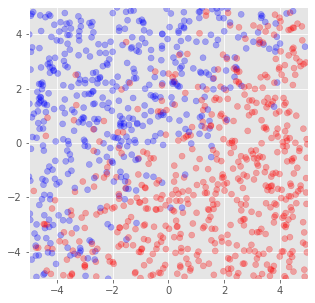

In [574]:
plt.figure(figsize=(5,5))
plt.ylim(y_min, y_max)
plt.xlim(x_min, x_max)
# plt.plot(x0, y0, color='gray')
# scat0 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1.set_offsets(points[i, :, :2])


from IPython.display import HTML
process=False
anim = animation.FuncAnimation(plt.gcf(), animate, frames=frames, interval=100, blit=True)
HTML(anim.to_html5_video())

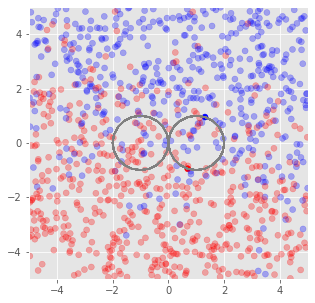

In [621]:
plt.figure(figsize=(5,5))
plt.ylim(y_min, y_max)
plt.xlim(x_min, x_max)
plt.plot(x0, y0, color='gray')
scat0 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1.set_offsets(points[i, :, :2])

from IPython.display import HTML
process=True
anim = animation.FuncAnimation(plt.gcf(), animate, frames=frames, interval=100, blit=True)
# HTML(anim.to_html5_video())
FFwriter = animation.FFMpegWriter()
anim.save('proc.mp4', writer = FFwriter, fps=10)

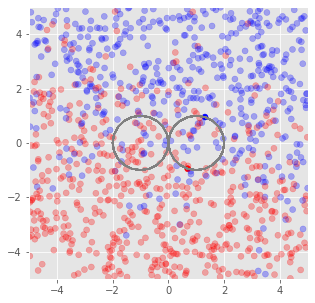

In [631]:
plt.figure(figsize=(5,5))
plt.ylim(y_min, y_max)
plt.xlim(x_min, x_max)
plt.plot(x0, y0, color='gray')
scat0 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1.set_offsets(points[i, :, :2])

from IPython.display import HTML
process=True
anim = animation.FuncAnimation(plt.gcf(), animate, frames=frames, interval=100, blit=True)
# HTML(anim.to_html5_video())
# FFwriter = animation.FFMpegWriter()
anim.save('proc.gif', writer='imagemagick', fps=10)

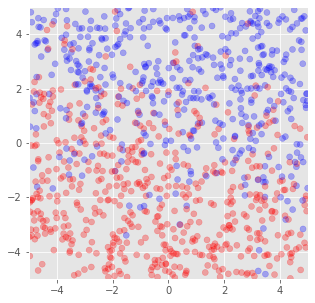

In [632]:
plt.figure(figsize=(5,5))
plt.ylim(y_min, y_max)
plt.xlim(x_min, x_max)
# plt.plot(x0, y0, color='gray')
# scat0 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1.set_offsets(points[i, :, :2])

from IPython.display import HTML
process=False
anim = animation.FuncAnimation(plt.gcf(), animate, frames=frames, interval=100, blit=True)
# HTML(anim.to_html5_video())
# FFwriter = animation.FFMpegWriter()
anim.save('noproc.gif', writer='imagemagick', fps=10)

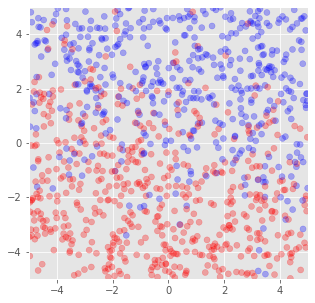

In [622]:
plt.figure(figsize=(5,5))
plt.ylim(y_min, y_max)
plt.xlim(x_min, x_max)
# plt.plot(x0, y0, color='gray')
# scat0 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1 = plt.scatter(x=[x_min,x_max], y=[y_min,y_max])
scat1.set_offsets(points[i, :, :2])

from IPython.display import HTML
process=False
anim = animation.FuncAnimation(plt.gcf(), animate, frames=frames, interval=100, blit=True)
# HTML(anim.to_html5_video())
FFwriter = animation.FFMpegWriter()
anim.save('noproc.mp4', writer = FFwriter)

In [ ]:
FFwriter = animation.FFMpegWriter()
anim.save('noproc.mp4', writer = FFwriter, fps=10)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[3.86946792 3.78443517 3.70131327 ... 3.62010221 3.70131327 3.78443517]
 [3.78443517 3.69940242 3.61628052 ... 3.53506946 3.61628052 3.69940242]
 [3.70131327 3.61628052 3.53315861 ... 3.45194756 3.53315861 3.61628052]
 ...
 [3.62010221 3.53506946 3.45194756 ... 3.3707365  3.45194756 3.53506946]
 [3.70131327 3.61628052 3.53315861 ... 3.45194756 3.53315861 3.61628052]
 [3.78443517 3.69940242 3.61628052 ... 3.53506946 3.61628052 3.69940242]]
[[7.55800383 7.39191436 7.22955724 ... 7.07093247 7.22955724 7.39191436]
 [7.39191436 7.22582489 7.06346778 ... 6.904843   7.06346778 7.22582489]
 [7.22955724 7.06346778 6.90111066 ... 6.74248588 6.90111066 7.06346778]
 ...
 [7.07093247 6.90484

[[-14.89840197 -14.57100499 -14.25096524 ... -13.93828273 -14.25096524
  -14.57100499]
 [-14.57100499 -14.243608   -13.92356826 ... -13.61088575 -13.92356826
  -14.243608  ]
 [-14.25096524 -13.92356826 -13.60352851 ... -13.290846   -13.60352851
  -13.92356826]
 ...
 [-13.93828273 -13.61088575 -13.290846   ... -12.97816349 -13.290846
  -13.61088575]
 [-14.25096524 -13.92356826 -13.60352851 ... -13.290846   -13.60352851
  -13.92356826]
 [-14.57100499 -14.243608   -13.92356826 ... -13.61088575 -13.92356826
  -14.243608  ]]
[[-16.72158096 -16.35411905 -15.99491472 ... -15.64396796 -15.99491472
  -16.35411905]
 [-16.35411905 -15.98665715 -15.62745282 ... -15.27650606 -15.62745282
  -15.98665715]
 [-15.99491472 -15.62745282 -15.26824849 ... -14.91730173 -15.26824849
  -15.62745282]
 ...
 [-15.64396796 -15.27650606 -14.91730173 ... -14.56635497 -14.91730173
  -15.27650606]
 [-15.99491472 -15.62745282 -15.26824849 ... -14.91730173 -15.26824849
  -15.62745282]
 [-16.35411905 -15.98665715 -15.62

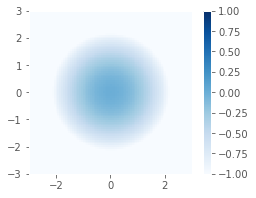

In [209]:
# Example animations using matplotlib's FuncAnimation
# Ken Hughes. 18 June 2016.

# For more detail, see
# https://brushingupscience.wordpress.com/2016/06/21/matplotlib-animations-the-easy-way/

# Examples include
#    - line plot
#    - pcolor plot
#    - scatter plot
#    - contour plot
#    - quiver plot
#    - plot with changing labels

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Use matplotlib ggplot stylesheet if available
try:
    plt.style.use('ggplot')
except:
    pass

# Set which type of animation will be plotted. One of:
# line, pcolor, scatter, contour, quiver, labels
animation_type = 'pcolor'

# ----------------------------------------------------------------------------
# Create data to plot. F is 2D array. G is 3D array

# Create a two-dimensional array of data: F(x, t)
x = np.linspace(-3, 3, 91)
t = np.linspace(0, 25, 30)
X2, T2 = np.meshgrid(x, t)
sinT2 = np.sin(2*np.pi*T2/T2.max())
F = 0.9*sinT2*np.sinc(X2*(1 + sinT2))

# Create three-dimensional array of data G(x, z, t)
x = np.linspace(-3, 3, 91)
t = np.linspace(0, 25, 30)
y = np.linspace(-3, 3, 91)
X3, Y3, T3 = np.meshgrid(x, y, t)
sinT3 = np.sin(2*np.pi*T3 /
               T3.max(axis=2)[..., np.newaxis])
G = (X3**2 + Y3**2)*sinT3

# ----------------------------------------------------------------------------
# Set up the figure and axis
fig, ax = plt.subplots(figsize=(4, 3))

if animation_type not in ['line', 'scatter']:
    ax.set_aspect('equal')


# ----------------------------------------------------------------------------
if animation_type == 'line':
    ax.set(xlim=(-3, 3), ylim=(-1, 1))

    line = ax.plot(x, F[0, :], color='k', lw=2)[0]

    def animate(i):
        line.set_ydata(F[i, :])

# ----------------------------------------------------------------------------
if animation_type == 'pcolor':
    cax = ax.pcolormesh(x, y, G[:-1, :-1, 0], vmin=-1, vmax=1, cmap='Blues')
    fig.colorbar(cax)

    def animate(i):
        print(G[:-1, :-1, i])
        cax.set_array(G[:-1, :-1, i].flatten())

# ----------------------------------------------------------------------------
if animation_type == 'scatter':
    ax.set(xlim=(-3, 3), ylim=(-1, 1))
    scat = ax.scatter(x[::3], F[0, ::3])

    def animate(i):
        # Must pass scat.set_offsets an N x 2 array
        y_i = F[i, ::3]
        scat.set_offsets(np.c_[x[::3], y_i])

# ----------------------------------------------------------------------------
if animation_type == 'contour':
    # Keyword options used in every call to contour
    contour_opts = {'levels': np.linspace(-9, 9, 10), 'cmap':'RdBu', 'lw': 2}
    cax = ax.contour(x, y, G[..., 0], **contour_opts)

    def animate(i):
        ax.collections = []
        ax.contour(x, y, G[..., i], **contour_opts)

# ----------------------------------------------------------------------------
if animation_type == 'quiver':
    ax.set(xlim=(-4, 4), ylim=(-4, 4))

    # Plot every 20th arrow
    step = 15
    x_q, y_q = x[::step], y[::step]

    # Create U and V vectors to plot
    U = G[::step, ::step, :-1].copy()
    V = np.roll(U, shift=4, axis=2)

    qax = ax.quiver(x_q, y_q, U[..., 0], V[..., 0], scale=100)

    def animate(i):
        qax.set_UVC(U[..., i], V[..., i])

# ----------------------------------------------------------------------------
if animation_type == 'labels':
    ax.set(xlim=(-1, 1), ylim=(-1, 1))
    string_to_type = 'abcdefghijklmnopqrstuvwxyz0123'
    label = ax.text(0, 0, string_to_type[0],
                    ha='center', va='center',
                    fontsize=12)

    def animate(i):
        label.set_text(string_to_type[:i+1])
        ax.set_ylabel('Time (s): ' + str(i/10))
        ax.set_title('Frame ' + str(i))

# ----------------------------------------------------------------------------
# Save the animation
anim = FuncAnimation(fig, animate, interval=100, frames=len(t)-1, repeat=True)
HTML(anim.to_html5_video())
# fig.show()
# anim.save(animation_type + '.gif', writer='imagemagick')

In [498]:
np.random.randn(100).reshape(-1, 2).max(axis=0)

array([2.45036111, 2.04843253])

In [637]:
m = nn.Conv1d(24, 24, 1)
input = torch.randn(32, 24, 100)
m(input).shape

torch.Size([32, 24, 100])

In [4]:
import aggets.model.fourier as m_fou
net = m_fou.MultiHistogramBlock(3, 64, 1, 10)


In [11]:
hl = m_fou.HistogramLerner(size=12, hists=5, types=2, t_in=10)
rb = m_fou.RecurrentBlock(hl, 8)
rb.forward(torch.randn(32, 12, 5, 2, 10)).shape

torch.Size([32, 12, 5, 2, 8])

In [694]:
net(torch.randn(32, 12, 10)).shape

torch.Size([32, 12, 1])


torch.Size([32, 12, 1])

In [733]:
x = torch.arange(60. * 26).reshape(B, s, T_in)

In [902]:

B = 4
s = 3
T_in = 5
hists=13
types=2

def convert(x, B, s, T_in, hists, types)
    grid = torch.tensor(np.linspace(0, 2 * np.pi, s).reshape(1, s, 1), dtype=torch.float)
    hist_id = torch.tensor(np.linspace(0, 2 * np.pi, hists).reshape(hists, 1, 1), dtype=torch.float)
    type_id = torch.tensor(np.linspace(0, 2 * np.pi, types).reshape(1, 1, types), dtype=torch.float)

    # flatten dims
    x = torch.cat([x[:, :, h] for h in range(x.shape[2])])
    x = torch.cat([x[:, :, h] for h in range(x.shape[2])])

    B = x.shape[0]
    # add position information, histogram_id information and histogram type information
    x = torch.cat([x.reshape(B, s, T_in), grid.repeat(B,1,1)], dim=-1)
    x = torch.cat([x.reshape(B, s, T_in + 1), hist_id.repeat(B // hists, s, 1)], dim=-1)
    x = torch.cat([x.reshape(B, s, T_in + 2), type_id.repeat_interleave(B // types * s).reshape(B, s, 1)], dim=-1)


torch.Size([1, 3, 1]) torch.Size([13, 1, 1]) torch.Size([1, 1, 2])
torch.Size([4, 3, 13, 2, 5])


tensor([[[0.0000, 0.0000, 0.0000],
         [3.1416, 0.0000, 0.0000],
         [6.2832, 0.0000, 0.0000]],

        [[0.0000, 0.5236, 0.0000],
         [3.1416, 0.5236, 0.0000],
         [6.2832, 0.5236, 0.0000]],

        [[0.0000, 1.0472, 0.0000],
         [3.1416, 1.0472, 0.0000],
         [6.2832, 1.0472, 0.0000]],

        [[0.0000, 1.5708, 0.0000],
         [3.1416, 1.5708, 0.0000],
         [6.2832, 1.5708, 0.0000]],

        [[0.0000, 2.0944, 0.0000],
         [3.1416, 2.0944, 0.0000],
         [6.2832, 2.0944, 0.0000]],

        [[0.0000, 2.6180, 0.0000],
         [3.1416, 2.6180, 0.0000],
         [6.2832, 2.6180, 0.0000]],

        [[0.0000, 3.1416, 0.0000],
         [3.1416, 3.1416, 0.0000],
         [6.2832, 3.1416, 0.0000]],

        [[0.0000, 3.6652, 0.0000],
         [3.1416, 3.6652, 0.0000],
         [6.2832, 3.6652, 0.0000]],

        [[0.0000, 4.1888, 0.0000],
         [3.1416, 4.1888, 0.0000],
         [6.2832, 4.1888, 0.0000]],

        [[0.0000, 4.7124, 0.0000],
  

In [711]:
size = 3
batch = 4
t = 5
grid = torch.tensor(np.linspace(0, 2 * np.pi, size).reshape(1, size, 1), dtype=torch.float)

x = torch.randn(batch, 5, 2, size, t)
# torch.cat([x.reshape(batch, size, 1), self.grid.repeat(batch, 1, 1)], dim=2)
x.reshape(-1, size, 10).shape

torch.Size([20, 3, 10])

In [103]:
agg = torch.rand(8, 30, 2, 10)
ids = torch.Tensor(np.linspace(0, agg.shape[1] - 1, agg.shape[1])).repeat(agg.shape[0], 2, 1)
ids = torch.stack([ids.transpose(1, 2)], dim=-1)
agg = torch.cat([ids, agg], dim=-1)

In [104]:
print(agg[:, 0, 0, 0])
print(agg[:, 1, 0, 0])
print(agg[:, 2, 0, 0])
print(agg[:, 0, 1, 0])
print(agg[:, 1, 1, 0])
print(agg[:, 2, 1, 0])

tensor([0., 0., 0., 0., 0., 0., 0., 0.])
tensor([1., 1., 1., 1., 1., 1., 1., 1.])
tensor([2., 2., 2., 2., 2., 2., 2., 2.])
tensor([0., 0., 0., 0., 0., 0., 0., 0.])
tensor([1., 1., 1., 1., 1., 1., 1., 1.])
tensor([2., 2., 2., 2., 2., 2., 2., 2.])


In [96]:
agg[0, :, 0, 0]
print(agg.shape)

ids = torch.Tensor(np.linspace(0, agg.shape[1] - 1, agg.shape[1])).repeat(agg.shape[0], 2, 1).transpose(1,2)
ids = torch.stack([ids], dim=-1)
torch.cat([k, agg], dim=-1)[0, :, 0, 0]

torch.Size([8, 3, 2, 10])


tensor([0., 1., 2.])

In [3]:
torch.cat([torch.randn(32, 12, 12, 1), torch.randn(32, 1, 1, 1)], dim=3).shape

RuntimeError: Sizes of tensors must match except in dimension 3. Got 12 and 1 in dimension 1 (The offending index is 1)

In [37]:
batch=8
seq = 3
vals = 10
x = torch.rand(batch, seq, vals)
ids = torch.Tensor(np.linspace(0, seq-1, seq)).repeat(batch, 1)
print(ids.reshape(batch, seq, 1).shape, x.shape)
torch.cat([x, ids.reshape(batch, seq, 1)], dim=2)

torch.Size([8, 3, 1]) torch.Size([8, 3, 10])


tensor([[[2.4815e-01, 9.7603e-01, 1.5675e-01, 9.8966e-01, 8.5705e-01,
          2.8823e-01, 7.1337e-02, 8.7194e-01, 5.4235e-01, 3.8379e-02,
          0.0000e+00],
         [7.3597e-01, 3.6543e-01, 8.4556e-01, 3.6282e-01, 2.1558e-01,
          4.4795e-01, 3.6617e-01, 1.7324e-01, 9.4497e-01, 6.2043e-01,
          1.0000e+00],
         [7.3755e-01, 8.3161e-01, 8.9905e-02, 5.2023e-01, 2.1607e-01,
          5.7744e-01, 1.6816e-01, 4.7108e-01, 1.9315e-01, 2.5012e-01,
          2.0000e+00]],

        [[3.2237e-01, 1.0380e-01, 9.8468e-01, 5.3423e-01, 4.7106e-01,
          4.9292e-01, 6.5125e-01, 9.4971e-01, 8.2311e-01, 6.3809e-01,
          0.0000e+00],
         [4.7682e-01, 1.8755e-01, 2.6490e-02, 4.1926e-01, 6.4415e-01,
          2.7585e-01, 7.1163e-01, 8.1442e-01, 7.2542e-01, 7.2130e-01,
          1.0000e+00],
         [3.5670e-02, 1.4771e-01, 7.1825e-02, 8.3624e-01, 7.2886e-01,
          8.6937e-01, 6.8476e-01, 8.7631e-02, 7.6462e-01, 1.0211e-01,
          2.0000e+00]],

        [[8.0959e-